<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red">r0653717, r0736565, r0575991, r0829669, r0776192</span>.

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 0* and you start from this template notebook. The notebook you submit for grading is the last notebook you submit in the [Kaggle competition](https://www.kaggle.com/t/b7a2a8743bd842ca9ac93ae91cbc8d9f) prior to the deadline on **Tuesday 18 May 23:59**. Closely follow [these instructions](https://github.com/gourie/kaggle_inclass) for joining the competition, sharing your notebook with the TAs and making a valid notebook submission to the competition. A notebook submission not only produces a *submission.csv* file that is used to calculate your competition score, it also runs the entire notebook and saves its output as if it were a report. This way it becomes an all-in-one-place document for the TAs to review. As such, please make sure that your final submission notebook is self-contained and fully documented (e.g. provide strong arguments for the design choices that you make). Most likely, this notebook format is not appropriate to run all your experiments at submission time (e.g. the training of CNNs is a memory hungry and time consuming process; due to limited Kaggle resources). It can be a good idea to distribute your code otherwise and only summarize your findings, together with your final predictions, in the submission notebook. For example, you can substitute experiments with some text and figures that you have produced "offline" (e.g. learning curves and results on your internal validation set or even the test set for different architectures, pre-processing pipelines, etc). We advise you to first go through the PDF of this assignment entirely before you really start. Then, it can be a good idea to go through this notebook and use it as your first notebook submission to the competition. You can make use of the *Group assignment 1* forum/discussion board on Toledo if you have any questions. Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# 1. Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook:
* Image classification (Sect. 2)
* Semantic segmentation (Sect. 3)
* Adversarial attacks (Sect. 4)

In the first part, you will train an end-to-end neural network for image classification. In the second part, you will do the same for semantic segmentation. For these two tasks we expect you to put a significant effort into optimizing performance and as such competing with fellow students via the Kaggle competition. In the third part, you will try to find and exploit the weaknesses of your classification and/or segmentation network. For the latter there is no competition format, but we do expect you to put significant effort in achieving good performance on the self-posed goal for that part. Finally, we ask you to reflect and produce an overall discussion with links to the lectures and "real world" computer vision (Sect. 5). It is important to note that only a small part of the grade will reflect the actual performance of your networks. However, we do expect all things to work! In general, we will evaluate the correctness of your approach and your understanding of what you have done that you demonstrate in the descriptions and discussions in the final notebook.

## 1.1 Deep learning resources
If you did not yet explore this in *Group assignment 0 (Sect. 2)*, we recommend using the TensorFlow and/or Keras library for building deep learning models. You can find a nice crash course [here](https://colab.research.google.com/drive/1UCJt8EYjlzCs1H1d1X0iDGYJsHKwu-NO).

In [51]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt

## 1.2 PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


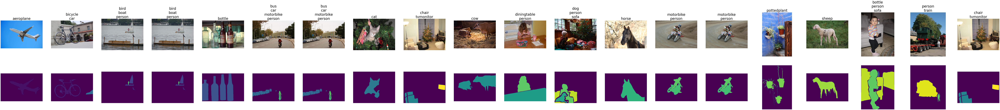

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [3]:
# Loading the training data
train_df = pd.read_csv('kul-h02a5a-computervision-groupassignment1/train/train_set.csv', index_col="Id") #'/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/train_set.csv'
labels = train_df.columns
train_df["img"] = [np.load('kul-h02a5a-computervision-groupassignment1/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()] #'/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/img/train_{}.npy'
train_df["seg"] = [np.load('kul-h02a5a-computervision-groupassignment1/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()] #'/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/seg/train_{}.npy'
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [4]:
# Loading the test data 
test_df = pd.read_csv('kul-h02a5a-computervision-groupassignment1/test/test_set.csv', index_col="Id") #'/kaggle/input/kul-h02a5a-computervision-groupassignment1/test/test_set.csv'
test_df["img"] = [np.load('kul-h02a5a-computervision-groupassignment1/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()] #'/kaggle/input/kul-h02a5a-computervision-groupassignment1/test/img/test_{}.npy'
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 1.3 Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [5]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 2. Image classification
The goal here is simple: implement a classification CNN and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe).

In [6]:
class RandomClassificationModel:
    """
    Random classification model: 
        - generates random labels for the inputs based on the class distribution observed during training
        - assumes an input can have multiple labels
    """
    def fit(self, X, y):
        """
        Adjusts the class ratio variable to the one observed in y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        y: list of arrays - n x (nb_classes)

        Returns
        -------
        self
        """
        self.distribution = np.mean(y, axis=0)
        print("Setting class distribution to:\n{}".format("\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        y_pred: list of arrays - n x (nb_classes)
        """
        np.random.seed(0)
        return [np.array([int(np.random.rand() < p) for p in self.distribution]) for _ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomClassificationModel()
model.fit(train_df["img"], train_df[labels])
test_df.loc[:, labels] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
aeroplane: 0.06275033377837116
bicycle: 0.0520694259012016
bird: 0.07343124165554073
boat: 0.06408544726301736
bottle: 0.056074766355140186
bus: 0.050734312416555405
car: 0.08411214953271028
cat: 0.06008010680907877
chair: 0.09212283044058744
cow: 0.04005340453938585
diningtable: 0.06408544726301736
dog: 0.05740987983978638
horse: 0.056074766355140186
motorbike: 0.06275033377837116
person: 0.27636849132176233
pottedplant: 0.05740987983978638
sheep: 0.036048064085447265
sofa: 0.05874499332443257
train: 0.0534045393858478
tvmonitor: 0.06809078771695594


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 2.1 CNN From Scratch
The first method of creating a model will be from scratch. For this the Keras library will be used. <br />


### 2.1.1. Setting up the Model
We start by setting up the model. The model mainly consists of convolutional layers (hence Convolutional Neural Network or CNN). A convolutional layer is always followed by the hidden activation layer and, in our case, also followed by a pooling layer as to reduce the size of the info each layer. A batchnormalisation layer is also added in between each activation and pooling layer. At the end, there are also 2 fully connected layers ending with a fully connected layer with 20 outputs, for the 20 classes. We're however only given 749 training images for 20 classes, which is definitely not a lot and probably not enough to learn this network from scratch, so we're trying to keep the amount of parameters within boundaries. <br />
We're using a batch size of 64 and the image size is set to 200 by 200

In [55]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras import backend as K

batch_size = 64
image_size = (200, 200)

class OwnModel():
    def __init__(self):
        self.model = Sequential()
        # Convolutional Layers
        self.model.add(Conv2D(16, (1, 1), input_shape= (image_size[0], image_size[1], 3)))
        self.model.add(Activation('relu'))
        self.model.add(BatchNormalization())
        self.model.add(MaxPooling2D(pool_size=(2, 2)))

        self.model.add(Conv2D(16, (3, 3)))
        self.model.add(Activation('relu'))
        self.model.add(BatchNormalization())
        self.model.add(MaxPooling2D(pool_size=(2, 2)))

        self.model.add(Conv2D(32, (1, 1)))
        self.model.add(Activation('relu'))
        self.model.add(BatchNormalization())
        self.model.add(MaxPooling2D(pool_size=(2, 2)))

        # Fully connected layers
        self.model.add(Flatten())
        self.model.add(Dense(32))
        self.model.add(Activation('relu'))

        self.model.add(Dropout(0.5))
        self.model.add(Dense(20))
        self.model.add(Activation('sigmoid'))

        self.model.compile(loss='binary_crossentropy',
                      optimizer='adam',
                      metrics=['accuracy'])
        self.model.summary()
        
    def fit(self, train_generator):
        self.model.fit(
            train_generator,
            steps_per_epoch = 749 // batch_size,
            epochs = 35,
            shuffle = True
        )
        return self
        
    def predict(self, test_generator):
        return self.model.predict(test_generator, verbose=1)

### 2.1.2. Getting the Data and Generators Ready
Before we train the model, we will preprocess the images by making slight variations on the images. This way we have more images and it's a first step to preventing overfitting as it will be more robust to these slight transformations. The CNN is also trained with a given batch size. This requires less memory and will probably train our network faster, however the smaller the batches, the harder it is to estimate the error gradients, used to update the weights in a neural network, correctly. Since our variations on images are still highly correlated, it also wouldn't have been enough.

In [57]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

# This is the configuration we will use for training
# The rescale scales all RGB values down to 0 - 1 before applying any transformations.
train_datagen = ImageDataGenerator(
        rotation_range=20,
        shear_range=0.2,
        horizontal_flip=True)

# The test data will get the same rescale, but obviously not the rest of the transformations.
test_datagen = ImageDataGenerator(rescale=1./255)

# Resizing the images and getting the labels as to be able to use them in the generator.
train_img = np.empty((749, image_size[0], image_size[1], 3))
i = 0
for img in train_df["img"]:
    image = tf.image.resize(img, image_size)
    train_img[i] = image
    i += 1

test_img = np.empty((750, image_size[0], image_size[1], 3)) 
i = 0
for img in test_df["img"]:
    image = tf.image.resize(img, image_size)
    test_img[i] = image
    i += 1

# this is a generator that will read pictures found in
# subfolers of 'data/train', and indefinitely generate
# batches of augmented image data
train_generator = train_datagen.flow(
        x = train_img,
        y = train_df[labels],
        batch_size=batch_size )

# this is a similar generator, for validation data
test_generator = test_datagen.flow(
        x = test_img,
        batch_size = 1,
        shuffle=False )

### 2.1.3. Fitting the Model and Getting Results

In [58]:
test_generator.reset()
model = OwnModel()
model.fit(train_generator)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 200, 200, 16)      64        
_________________________________________________________________
activation (Activation)      (None, 200, 200, 16)      0         
_________________________________________________________________
batch_normalization (BatchNo (None, 200, 200, 16)      64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 100, 100, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 98, 98, 16)        2320      
_________________________________________________________________
activation_1 (Activation)    (None, 98, 98, 16)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 98, 98, 16)        6

750/750 [==============================] - 4s 5ms/step


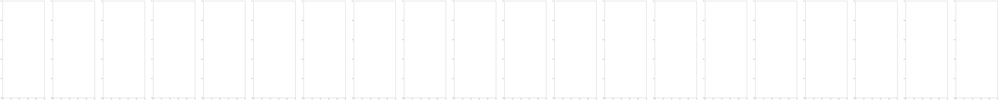

In [59]:
pred = model.predict(test_generator)

madeIt = []
i = 0
for classes in pred:
    j = 0
    for outcome in classes:
        if (outcome > 0.30):
            madeIt.append((i, j))
        j += 1
    i += 1

# Show some examples
fig, axs = plt.subplots(1, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(madeIt[0:19]):
    axs[i].imshow(test_img[label[0]]/255)
    axs[i].set_title(labels[label[1]], fontsize=40)
    axs[i].axis("off")
    
plt.show()

## 2.2 Transfer learning
The network that we will be using as base model is ResNet50. This model is trained on imagenet which has 1000 label classes. It expects input images of 224 x 224 that are normalized between -1 and 1, so the first step is to adapt our dataset images to meet these requirements. We are using a data generator that will transform the data set images to be comform with these requirements, and to change them enough so they can be used multiple times during training. 

In [60]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

batch_size = 64
image_size = (224, 224)
# This is the configuration we will use for training
# The rescale scales all RGB values down to 0 - 1 before applying any transformations.
train_datagen = ImageDataGenerator(
        rotation_range=20,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# The test data will get the same rescale, but obviously not the rest of the transformations.
test_datagen = ImageDataGenerator(rescale=1./255)

# Resizing the images and getting the labels as to be able to use them in the generator.
train_img = np.empty((749, image_size[0], image_size[1], 3))
i = 0
for img in train_df["img"]:
    image = tf.image.resize(img, image_size)
    train_img[i] = image
    i += 1
train_labels = train_df.iloc[:, :20].to_numpy()

test_img = np.empty((750, image_size[0], image_size[1], 3)) 
i = 0
for img in test_df["img"]:
    image = tf.image.resize(img, image_size)
    test_img[i] = image
    i += 1

# this is a generator that will read pictures found in
# subfolers of 'data/train', and indefinitely generate
# batches of augmented image data
train_generator = train_datagen.flow(
        x = train_img,
        y = train_labels,
        batch_size=batch_size )

# this is a similar generator, for validation data
validation_generator = test_datagen.flow(
        x = test_img,
        y = None,
        batch_size=batch_size )

In [63]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras import Model
from PIL import Image
import numpy as np
import skimage

base_model = MobileNetV2(weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Flatten()(x)
x = Dense(32, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(20, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['binary_accuracy']) #'rmsprop', loss='categorical_crossentropy')
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train end-to-end. Be careful to stop before you overfit!
model.fit(train_generator, epochs=100)  #, callbacks=..., validation_data=...)

Epoch 1/100
12/12 [==============================] - 15s 1s/step - loss: 4.2106 - binary_accuracy: 0.5012
Epoch 2/100
12/12 [==============================] - 14s 1s/step - loss: 3.9690 - binary_accuracy: 0.5836
Epoch 3/100
12/12 [==============================] - 14s 1s/step - loss: 3.8365 - binary_accuracy: 0.6014
Epoch 4/100
12/12 [==============================] - 14s 1s/step - loss: 3.6986 - binary_accuracy: 0.6432
Epoch 5/100
12/12 [==============================] - 14s 1s/step - loss: 3.5878 - binary_accuracy: 0.6656
Epoch 6/100
12/12 [==============================] - 14s 1s/step - loss: 3.5107 - binary_accuracy: 0.6977
Epoch 7/100
12/12 [==============================] - 15s 1s/step - loss: 3.4348 - binary_accuracy: 0.7192
Epoch 8/100
12/12 [==============================] - 14s 1s/step - loss: 3.3249 - binary_accuracy: 0.7404
Epoch 9/100
12/12 [==============================] - 15s 1s/step - loss: 3.2971 - binary_accuracy: 0.7537
Epoch 10/100
12/12 [==========================

In [68]:
for layer in base_model.layers:
    layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy'])# loss='categorical_crossentropy')

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
model.fit(train_generator, epochs=50)

Epoch 1/50
12/12 [==============================] - 122s 10s/step - loss: 0.2291 - binary_accuracy: 0.9386
Epoch 2/50
12/12 [==============================] - 129s 11s/step - loss: 0.2429 - binary_accuracy: 0.9389
Epoch 3/50
12/12 [==============================] - 123s 10s/step - loss: 0.2213 - binary_accuracy: 0.9381
Epoch 4/50
12/12 [==============================] - 123s 10s/step - loss: 0.2171 - binary_accuracy: 0.9399
Epoch 5/50
12/12 [==============================] - 122s 10s/step - loss: 0.2178 - binary_accuracy: 0.9401
Epoch 6/50
12/12 [==============================] - 122s 10s/step - loss: 0.1903 - binary_accuracy: 0.9419
Epoch 7/50
12/12 [==============================] - 123s 10s/step - loss: 0.2017 - binary_accuracy: 0.9416
Epoch 8/50
12/12 [==============================] - 122s 10s/step - loss: 0.1873 - binary_accuracy: 0.9412
Epoch 9/50
12/12 [==============================] - 123s 10s/step - loss: 0.1993 - binary_accuracy: 0.9409
Epoch 10/50
12/12 [==================

In [70]:
#uncomment this to save the trained network
#model.save("transfer_learning_model")

#load model to save time on training it again
model = keras.models.load_model("transfer_learning_model")

Predicted: [[4.51860882e-10 2.23458082e-05 1.45810745e-07 ... 2.27199637e-09
  2.48951776e-10 2.22466863e-08]
 [7.01375180e-10 2.42365452e-08 2.60773301e-03 ... 1.24269164e-07
  1.49249821e-08 4.50753723e-05]
 [2.56373482e-08 5.53872610e-07 1.87296500e-05 ... 1.29006651e-06
  6.58493207e-07 5.28398368e-06]
 ...
 [4.62731123e-07 4.55200672e-04 9.40024853e-04 ... 3.12318807e-05
  1.71311967e-07 3.30931580e-05]
 [1.16031886e-04 2.35875887e-05 4.08589840e-04 ... 4.64308357e-07
  3.17868590e-03 5.19003152e-06]
 [3.48077958e-13 1.13734282e-11 2.07683719e-08 ... 1.70189665e-07
  3.67192637e-15 3.90075279e-08]]
[4.5186088e-10 2.2345808e-05 1.4581074e-07 3.6292015e-08 9.7706914e-04
 8.6978478e-09 1.6725063e-04 8.3711988e-09 5.2166018e-07 2.5826711e-07
 2.6815978e-06 5.6370554e-05 1.8700957e-04 2.3019030e-08 8.6403030e-01
 6.8588662e-07 2.0227578e-08 2.2719964e-09 2.4895178e-10 2.2246686e-08]
person


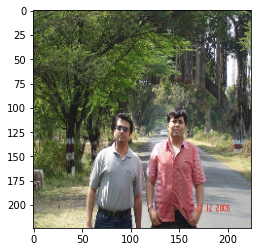

[7.0137518e-10 2.4236545e-08 2.6077330e-03 2.4537865e-08 5.5720939e-05
 1.9021286e-10 7.6135530e-06 5.9108181e-05 1.1508665e-06 1.0114193e-02
 8.9044514e-09 1.1044651e-06 8.0719590e-04 4.9384941e-09 2.5066733e-04
 4.4529393e-06 4.7686115e-01 1.2426916e-07 1.4924982e-08 4.5075372e-05]
sheep


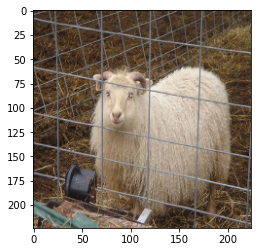

[2.56373482e-08 5.53872610e-07 1.87296500e-05 4.18662148e-06
 1.67132109e-01 4.34265394e-06 1.55739781e-05 5.67364339e-07
 1.10431411e-05 5.28129291e-08 2.82103538e-05 6.79943696e-07
 1.42646471e-07 2.57799206e-06 3.44634056e-03 1.17479605e-04
 3.53234759e-06 1.29006651e-06 6.58493207e-07 5.28398368e-06]
bottle


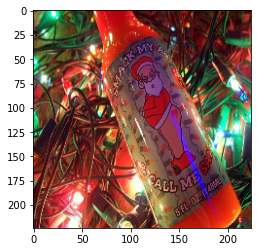

[1.9703224e-07 1.2133510e-04 9.5220938e-05 7.5246504e-08 9.7131369e-06
 3.1614215e-06 7.7542663e-04 8.4371291e-05 1.2299141e-04 3.1930977e-06
 1.1674398e-05 1.7336011e-04 1.7823882e-06 2.4449513e-05 6.5058885e-05
 2.9849112e-03 1.7521670e-05 4.6962202e-03 2.2814729e-06 4.2942166e-04]


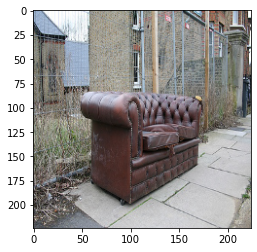

[5.3445365e-06 1.4787912e-04 1.4397502e-03 7.7513579e-07 2.9844046e-04
 5.2369069e-06 1.3726950e-04 6.9410009e-05 9.2031223e-05 4.3594882e-06
 1.2794137e-04 1.5443742e-02 4.2194559e-05 1.2869049e-06 9.4334960e-02
 3.2011569e-03 4.1317890e-08 1.5601516e-04 4.4176748e-10 4.0741338e-06]


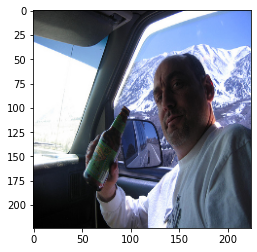

[4.7681235e-07 2.5766365e-05 2.6051104e-03 4.1915155e-06 1.4771581e-02
 1.8167498e-07 1.1207678e-05 2.3073924e-05 3.3253586e-05 6.0558617e-03
 1.9958365e-05 1.2667984e-02 1.9053578e-02 2.0961596e-05 5.2300471e-01
 3.7647951e-05 1.0922435e-04 2.2184295e-06 2.8153400e-09 1.6349944e-07]
person


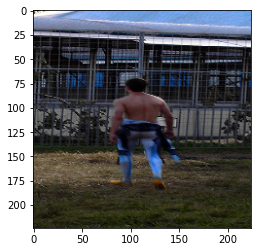

[5.5401631e-07 2.4508312e-01 1.5112758e-04 1.5276173e-05 4.2834878e-04
 3.9593519e-06 7.9200938e-05 6.4645807e-05 9.1546774e-04 2.5496056e-06
 1.1311104e-05 1.1269312e-04 4.9833165e-05 7.9060417e-05 1.7710227e-01
 1.8030405e-04 4.0124237e-06 1.3890862e-04 2.3354640e-07 9.1928244e-04]
bicycle
person


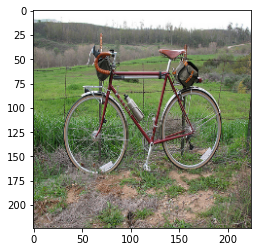

[5.5197535e-09 1.8756784e-07 6.7184615e-01 1.5552034e-06 3.9825639e-07
 1.4154697e-08 2.8940079e-07 1.0316385e-05 9.9057263e-07 1.2816737e-08
 7.2917928e-08 1.0661060e-07 1.7472320e-06 1.4839847e-07 3.6296248e-04
 2.8056925e-06 5.2482058e-08 7.8396477e-07 1.6958962e-08 4.9505326e-07]
bird


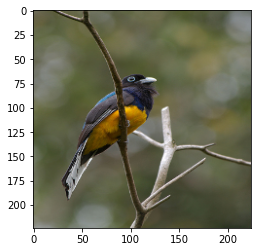

[4.06622469e-09 5.06087986e-07 2.59518623e-04 2.10134840e-06
 1.50412321e-04 5.36152278e-09 3.54046870e-06 2.76417040e-06
 1.46699449e-06 3.06070209e-01 1.92816394e-08 8.46070051e-03
 8.62404108e-02 1.16345845e-07 2.05815136e-02 8.09825724e-06
 1.08575821e-03 4.34429182e-07 2.55026800e-09 5.26599138e-07]
cow


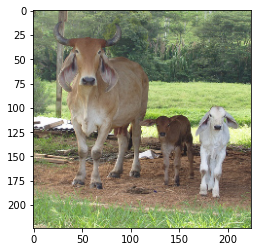

[2.09465384e-06 6.31332397e-04 2.59805911e-05 4.56631184e-04
 7.84205167e-06 2.09297832e-06 6.31886721e-03 3.16914484e-05
 1.06958996e-05 3.22428690e-07 5.25282019e-07 6.43014908e-04
 1.92649441e-05 2.24594057e-01 7.76316524e-02 1.11804824e-04
 5.55553299e-07 3.04127923e-07 1.94907188e-04 5.25982273e-07]
motorbike


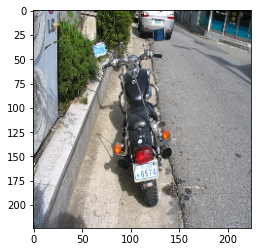

[1.9075648e-09 4.6899832e-08 3.1614900e-03 1.9861432e-07 5.4335274e-08
 4.1895030e-09 2.2301779e-07 2.6620328e-02 8.3073610e-07 8.5502911e-08
 6.0985865e-09 2.0177476e-05 4.4681425e-08 1.2155695e-05 1.4075637e-04
 3.0948253e-05 2.4037663e-08 4.8552647e-06 8.4242231e-11 3.4600654e-07]


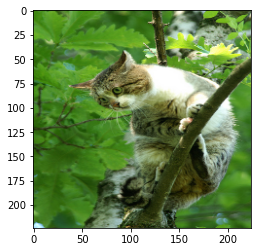

[2.6970039e-08 1.4747649e-05 8.7037813e-07 2.7797992e-06 3.6549568e-04
 1.1222608e-07 3.4457445e-04 8.0749327e-05 3.8226144e-06 1.4871957e-08
 3.5284052e-06 5.5959821e-04 4.9290082e-07 2.2799182e-01 2.6409370e-01
 1.9198978e-06 7.4343443e-09 2.2409124e-07 1.1858309e-09 6.4992371e-08]
person
motorbike


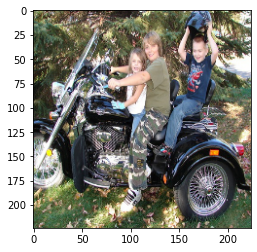

[4.20017017e-08 8.84382316e-05 3.25471163e-04 4.52829170e-07
 1.29833519e-02 1.01096425e-07 1.31356956e-05 2.35855579e-04
 1.45703554e-03 3.49564537e-08 2.50554681e-02 4.44297330e-05
 9.68934091e-06 9.75899979e-07 4.81422037e-01 3.09550762e-03
 7.13039139e-09 3.69748473e-03 7.63636709e-09 2.57393718e-03]
person


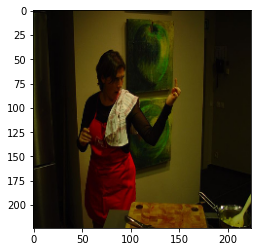

[5.9954320e-05 2.7643694e-07 3.2361777e-07 6.9102321e-06 1.1614326e-06
 6.0598534e-01 8.1202507e-02 2.2493429e-08 7.5038440e-07 1.2330502e-09
 7.7051465e-07 5.2356481e-06 5.7412919e-08 5.6521518e-08 9.2243850e-03
 9.0909282e-08 5.6137957e-08 3.4241189e-08 5.2939125e-05 9.2148857e-06]
bus


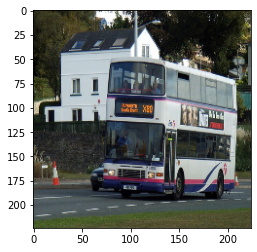

[1.02166211e-06 1.32519446e-07 5.81926251e-05 4.49359715e-01
 2.00860791e-06 3.08221729e-06 3.14036479e-05 1.40716265e-08
 1.34983111e-07 4.15843848e-09 6.11738971e-09 4.35597855e-07
 7.40996029e-07 8.61720025e-07 5.28594851e-03 1.35532100e-05
 2.31668608e-07 8.93433716e-10 2.01106071e-04 1.56801022e-07]
boat


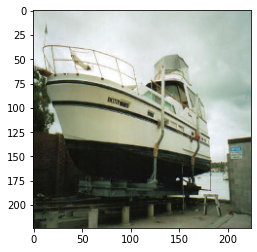

[9.7657779e-05 6.6313148e-04 6.7560368e-06 2.6600192e-06 1.3670325e-04
 4.6727860e-06 6.3048601e-03 4.5837547e-05 1.6772747e-04 1.8681586e-03
 4.3135881e-04 3.5471165e-01 2.2125635e-01 6.0676259e-05 8.3041579e-02
 1.7395616e-03 1.3242960e-03 2.3749428e-05 6.3930383e-05 1.8151115e-05]
dog
horse


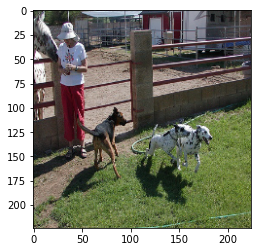

[3.6041335e-08 3.0732032e-08 3.1491458e-05 1.8322869e-06 7.0271027e-01
 1.9087851e-08 3.5318692e-06 3.6576399e-05 4.7533318e-05 6.9757022e-10
 1.0454565e-02 2.2893128e-06 7.5286565e-08 4.4065459e-08 7.7101022e-02
 1.4904141e-04 1.3779166e-06 5.7556690e-07 2.3357400e-09 4.4420813e-06]
bottle


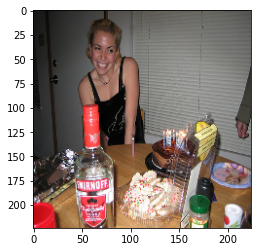

[2.6619561e-11 7.2625610e-08 5.4584640e-01 1.5697114e-07 1.8626638e-07
 2.9566688e-10 1.0277894e-08 4.6889813e-08 8.2843343e-08 4.4270143e-09
 2.8926170e-09 5.1977089e-08 5.1998978e-07 1.4771281e-09 2.0030141e-04
 7.4083168e-08 2.3318329e-08 3.0722013e-08 3.7667050e-11 4.2696815e-09]
bird


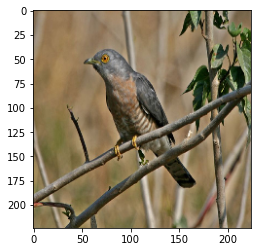

[1.5208193e-10 1.8748163e-09 6.2390268e-03 6.7368828e-06 6.0595648e-05
 7.1032728e-12 6.5620782e-08 4.2117324e-07 3.7162204e-09 4.4146180e-04
 3.8584302e-10 2.8542154e-05 1.2416840e-03 8.9559152e-11 1.1365116e-03
 4.9270676e-07 5.4197818e-02 8.2495732e-10 3.6064265e-10 8.8840428e-09]


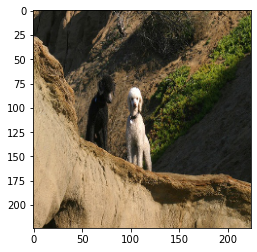

[4.0146169e-08 7.3026880e-05 2.4861218e-05 1.4736345e-07 2.3066938e-02
 9.9543413e-06 2.0296574e-03 8.5791051e-03 1.4252448e-01 2.4660230e-03
 2.3251176e-03 1.4176965e-04 4.7597289e-04 8.5702806e-05 6.1280429e-03
 2.1608174e-03 1.2513101e-03 3.3885241e-03 1.5144008e-06 6.7760402e-01]
tvmonitor
chair


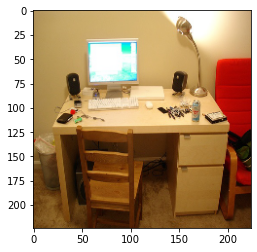

In [71]:
images = []
im = validation_generator.next()

preds = model.predict(im)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', preds)

for i in range(0,20):
    indexes = (-preds[i]).argsort()[:5]
    print(preds[i])
    for ind in indexes:
        if(preds[i, ind] > 0.1):
            print(labels[ind])
    image = im[i]
    plt.imshow(image)
    plt.show()

# 3. Semantic segmentation
The goal here is to implement a segmentation CNN that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your CNN and compete on the test set (by filling in the segmentation column in the test dataframe).

In [6]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
background: 0.7774704888071216
aeroplane: 0.007051912139390122
bicycle: 0.0030340461305405344
bird: 0.009781050583857026
boat: 0.007920222121661963
bottle: 0.00801371700061968
bus: 0.014444057783372053
car: 0.01299203192837253
cat: 0.016639155300546396
chair: 0.008264122763258911
cow: 0.006782009244183503
diningtable: 0.013744445666126768
dog: 0.0074080558785160075
horse: 0.008338953677311486
motorbike: 0.01079509937004467
person: 0.041013621147577735
pottedplant: 0.00539385590505006
sheep: 0.009157332163106574
sofa: 0.00958005931515607
train: 0.012118249521815817
tvmonitor: 0.010057513552370658


D:\ProgramData\Anaconda3\envs\CV2\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[0, 0, 0, 0, 0, 0, 0, 12, 17, 0, 3, 0, 0, 15,..."


## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [7]:
generate_submission(test_df)

,Predicted
Id,
0_classification,15 1 17 1
0_segmentation,19 1 24 1 335 1 429 1 720 1 779 1 884 1 1025 1...
1_classification,15 1
1_segmentation,166 1 187 1 425 1 683 1 888 1 900 1 980 1 1002...
2_classification,4 1 15 1
...,...
747_segmentation,117 1 238 1 487 1 706 1 733 1 847 1 926 1 1445...
748_classification,6 1 19 1
748_segmentation,46 1 48 1 65 1 765 1 788 1 932 1 1019 1 1025 1...


# 4. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation CNN, using an *adversarial attack*. More specifically, the goal is build a CNN to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the CNN classifies/segments these images in line with the perturbations.

# 5. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.